In [126]:
import json
import os
import sys
import itertools
import collections
import nltk; nltk.download('stopwords')
from nltk.corpus import stopwords
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import preprocessing
import numpy as np
#!pip install gensim
from gensim import corpora, models
from gensim.corpora import Dictionary
import gensim
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
#!pip install spacy
import spacy
!python3 -m spacy download en_core_web_sm
import pandas as pd
import random
import networkx as nx

from scipy.spatial.distance import pdist, squareform

import matplotlib.pyplot as plt
#!pip install chart_studio
import chart_studio.plotly as py
import plotly.graph_objects as go
import plotly.express as px
#!pip install pyLDAvis
import pyLDAvis
import pyLDAvis.gensim_models
#!pip install pyLDAvis.gensim
#import pyLDAvis.gensim
#!pip install community
import community
from IPython.display import Image
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/saipavantadikonda/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


     |████████████████████████████████| 13.9 MB 2.4 MB/s eta 0:00:01
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [127]:
courses_df = pd.read_csv('../data/combined_final.csv') 
courses_df

,Unnamed: 0,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University
0,0,ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC
1,1,ACCT 5311,Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC
2,2,ACCT 5312,Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC
3,3,ACCT 6110,Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC
4,4,ACCT 6120,Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC
...,...,...,...,...,...,...
27149,27149,WLC 8320,Cultural and Literary Analysis and Production,Cultural and Literary Analysis and Production3...,World Languages and Cultures,GSU
27150,27150,WLC 8330,"The Media, the Arts, and Popular Culture","The Media, the Arts, and Popular Culture3 Cred...",World Languages and Cultures,GSU
27151,27151,WLC 8340,Learning a World Language,Learning a World Language3 Credit Hours Descr...,World Languages and Cultures,GSU
27152,27152,WLC 8350,"Identities, Borders, and Social Justice in Lan...","Identities, Borders, and Social Justice in Lan...",World Languages and Cultures,GSU


In [128]:
courses_df.iloc[15].CourseNumber

'ACCT 6270 '

In [129]:
courses_df.iloc[15].CourseTitle

' Accounting for Business Combinations, Governmental, and Not-for-Profit Entities '

In [130]:
courses_df.iloc[15].CourseDescription

'Advanced concepts and practices in financial reporting with special emphasis on business combinations, consolidated financial statements and financial reporting issues and practices for governmental and other not-for-profit entities. In addition, the course examines current topics and emerging issues in financial reporting. '

In [131]:
courses_df.iloc[15].CourseDepartment

'Accounting'

In [132]:
courses_df1 = courses_df

In [133]:
def remove_extraspaces(x):
    return x.strip()
 

In [134]:
courses_df.CourseNumber = courses_df.CourseNumber.apply(remove_extraspaces)
courses_df.CourseTitle = courses_df.CourseTitle.apply(remove_extraspaces)
courses_df.CourseDescription = courses_df.CourseDescription.apply(remove_extraspaces)
courses_df.CourseDepartment = courses_df.CourseDepartment.apply(remove_extraspaces)
courses_df.University = courses_df.University.apply(remove_extraspaces)

In [135]:
courses_df

,Unnamed: 0,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University
0,0,ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC
1,1,ACCT 5311,Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC
2,2,ACCT 5312,Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC
3,3,ACCT 6110,Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC
4,4,ACCT 6120,Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC
...,...,...,...,...,...,...
27149,27149,WLC 8320,Cultural and Literary Analysis and Production,Cultural and Literary Analysis and Production3...,World Languages and Cultures,GSU
27150,27150,WLC 8330,"The Media, the Arts, and Popular Culture","The Media, the Arts, and Popular Culture3 Cred...",World Languages and Cultures,GSU
27151,27151,WLC 8340,Learning a World Language,Learning a World Language3 Credit Hours Descr...,World Languages and Cultures,GSU
27152,27152,WLC 8350,"Identities, Borders, and Social Justice in Lan...","Identities, Borders, and Social Justice in Lan...",World Languages and Cultures,GSU


In [136]:
courses_df.iloc[15].CourseDepartment

'Accounting'

In [137]:
courses_df = courses_df.loc[:, ~courses_df.columns.str.contains('^Unnamed')]
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University
0,ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC
1,ACCT 5311,Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC
2,ACCT 5312,Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC
3,ACCT 6110,Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC
4,ACCT 6120,Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC
...,...,...,...,...,...
27149,WLC 8320,Cultural and Literary Analysis and Production,Cultural and Literary Analysis and Production3...,World Languages and Cultures,GSU
27150,WLC 8330,"The Media, the Arts, and Popular Culture","The Media, the Arts, and Popular Culture3 Cred...",World Languages and Cultures,GSU
27151,WLC 8340,Learning a World Language,Learning a World Language3 Credit Hours Descr...,World Languages and Cultures,GSU
27152,WLC 8350,"Identities, Borders, and Social Justice in Lan...","Identities, Borders, and Social Justice in Lan...",World Languages and Cultures,GSU


In [138]:
#courses_df1[courses_df1['CourseNumber']=='ACC\xa0220']

In [139]:
courses_df[['CourseNumber','colisted_cno']] = courses_df['CourseNumber'].str.split('/',1,expand = True)
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University,colisted_cno
0,ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,None
1,ACCT 5311,Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC,None
2,ACCT 5312,Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC,None
3,ACCT 6110,Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC,None
4,ACCT 6120,Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC,None
...,...,...,...,...,...,...
27149,WLC 8320,Cultural and Literary Analysis and Production,Cultural and Literary Analysis and Production3...,World Languages and Cultures,GSU,None
27150,WLC 8330,"The Media, the Arts, and Popular Culture","The Media, the Arts, and Popular Culture3 Cred...",World Languages and Cultures,GSU,None
27151,WLC 8340,Learning a World Language,Learning a World Language3 Credit Hours Descr...,World Languages and Cultures,GSU,None
27152,WLC 8350,"Identities, Borders, and Social Justice in Lan...","Identities, Borders, and Social Justice in Lan...",World Languages and Cultures,GSU,None


In [140]:
courses_df['colisted_cno'] = courses_df['colisted_cno'].fillna(0)
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University,colisted_cno
0,ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,0
1,ACCT 5311,Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC,0
2,ACCT 5312,Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC,0
3,ACCT 6110,Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC,0
4,ACCT 6120,Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC,0
...,...,...,...,...,...,...
27149,WLC 8320,Cultural and Literary Analysis and Production,Cultural and Literary Analysis and Production3...,World Languages and Cultures,GSU,0
27150,WLC 8330,"The Media, the Arts, and Popular Culture","The Media, the Arts, and Popular Culture3 Cred...",World Languages and Cultures,GSU,0
27151,WLC 8340,Learning a World Language,Learning a World Language3 Credit Hours Descr...,World Languages and Cultures,GSU,0
27152,WLC 8350,"Identities, Borders, and Social Justice in Lan...","Identities, Borders, and Social Justice in Lan...",World Languages and Cultures,GSU,0


In [141]:
#def cleanup(x):
    #return x.split('/')[0].strip()
#courses_df.CourseNumber= courses_df.CourseNumber.apply(cleanup)

In [142]:
#def cleanup_1(x):
    #return x.split('/')[1].strip()
#courses_df['colisted_cno']= courses_df.CourseNumber.apply(cleanup_1)

In [143]:
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University,colisted_cno
0,ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,0
1,ACCT 5311,Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC,0
2,ACCT 5312,Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC,0
3,ACCT 6110,Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC,0
4,ACCT 6120,Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC,0
...,...,...,...,...,...,...
27149,WLC 8320,Cultural and Literary Analysis and Production,Cultural and Literary Analysis and Production3...,World Languages and Cultures,GSU,0
27150,WLC 8330,"The Media, the Arts, and Popular Culture","The Media, the Arts, and Popular Culture3 Cred...",World Languages and Cultures,GSU,0
27151,WLC 8340,Learning a World Language,Learning a World Language3 Credit Hours Descr...,World Languages and Cultures,GSU,0
27152,WLC 8350,"Identities, Borders, and Social Justice in Lan...","Identities, Borders, and Social Justice in Lan...",World Languages and Cultures,GSU,0


In [144]:
courses_df['CourseNumber'] = courses_df['CourseNumber'].apply(lambda x: str(x).replace(u'\xa0', u' '))

In [145]:
courses_df[courses_df['CourseNumber']=='ZO 553']

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University,colisted_cno
10258,ZO 553,Principles Of Wildlife Science,The principles of wildlife management and thei...,Zoology,NCSU,FW 553


In [146]:
test_df1 = courses_df.groupby(['CourseDepartment']).size().reset_index(name ='count')
test_df1

,CourseDepartment,count
0,AEROSPACE STUDIES,13
1,"AFRICAN, AFRICAN-AMERICAN, DIASPORA STUDIES",98
2,AMERICAN STUDIES,113
3,ANTHROPOLOGY,270
4,APPLIED SCIENCES,46
...,...,...
530,"Women’s, Gender & Sexuality Studies",49
531,Wood and Paper Science,2
532,World Languages and Cultures,12
533,YUCATEC MAYA LANGUAGE,1


In [147]:
test_df1['count'].max()

430

In [148]:
#fig = px.bar(test_df1, x='CourseDepartment', y='count')
#f1 = fig.to_image(format="png")
#Image(f1)

In [149]:
#courses_df1[courses_df1['CourseDepartment']=='Zoology']

In [150]:
courses_df[['deptcode','cno']] = courses_df['CourseNumber'].str.split(' ',1,expand = True)
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University,colisted_cno,deptcode,cno
0,ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,0,ACCT,5220
1,ACCT 5311,Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC,0,ACCT,5311
2,ACCT 5312,Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC,0,ACCT,5312
3,ACCT 6110,Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC,0,ACCT,6110
4,ACCT 6120,Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC,0,ACCT,6120
...,...,...,...,...,...,...,...,...
27149,WLC 8320,Cultural and Literary Analysis and Production,Cultural and Literary Analysis and Production3...,World Languages and Cultures,GSU,0,WLC,8320
27150,WLC 8330,"The Media, the Arts, and Popular Culture","The Media, the Arts, and Popular Culture3 Cred...",World Languages and Cultures,GSU,0,WLC,8330
27151,WLC 8340,Learning a World Language,Learning a World Language3 Credit Hours Descr...,World Languages and Cultures,GSU,0,WLC,8340
27152,WLC 8350,"Identities, Borders, and Social Justice in Lan...","Identities, Borders, and Social Justice in Lan...",World Languages and Cultures,GSU,0,WLC,8350


In [151]:
courses_df.dtypes

CourseNumber         object
CourseTitle          object
CourseDescription    object
CourseDepartment     object
University           object
colisted_cno         object
deptcode             object
cno                  object
dtype: object

In [152]:
courses_df.cno = courses_df.cno.str.extract('(\d+)')

In [153]:
courses_df.dtypes

CourseNumber         object
CourseTitle          object
CourseDescription    object
CourseDepartment     object
University           object
colisted_cno         object
deptcode             object
cno                  object
dtype: object

In [154]:
def course_level(courses_df):
    if int(courses_df.cno)<5000:
        y = 'Undergraduate'
    else: 
        y = 'Graduate'
    return y

In [155]:
courses_df['Course Level']= courses_df.apply(course_level,axis =1)
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University,colisted_cno,deptcode,cno,Course Level
0,ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,0,ACCT,5220,Graduate
1,ACCT 5311,Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC,0,ACCT,5311,Graduate
2,ACCT 5312,Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC,0,ACCT,5312,Graduate
3,ACCT 6110,Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC,0,ACCT,6110,Graduate
4,ACCT 6120,Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC,0,ACCT,6120,Graduate
...,...,...,...,...,...,...,...,...,...
27149,WLC 8320,Cultural and Literary Analysis and Production,Cultural and Literary Analysis and Production3...,World Languages and Cultures,GSU,0,WLC,8320,Graduate
27150,WLC 8330,"The Media, the Arts, and Popular Culture","The Media, the Arts, and Popular Culture3 Cred...",World Languages and Cultures,GSU,0,WLC,8330,Graduate
27151,WLC 8340,Learning a World Language,Learning a World Language3 Credit Hours Descr...,World Languages and Cultures,GSU,0,WLC,8340,Graduate
27152,WLC 8350,"Identities, Borders, and Social Justice in Lan...","Identities, Borders, and Social Justice in Lan...",World Languages and Cultures,GSU,0,WLC,8350,Graduate


In [156]:
courses_df.isnull().sum()

CourseNumber         0
CourseTitle          0
CourseDescription    0
CourseDepartment     0
University           0
colisted_cno         0
deptcode             0
cno                  0
Course Level         0
dtype: int64

In [157]:
courses_df.dtypes

CourseNumber         object
CourseTitle          object
CourseDescription    object
CourseDepartment     object
University           object
colisted_cno         object
deptcode             object
cno                  object
Course Level         object
dtype: object

In [158]:
test_df2 = courses_df.groupby(['Course Level']).size().reset_index(name ='count')
test_df2

,Course Level,count
0,Graduate,6721
1,Undergraduate,20433


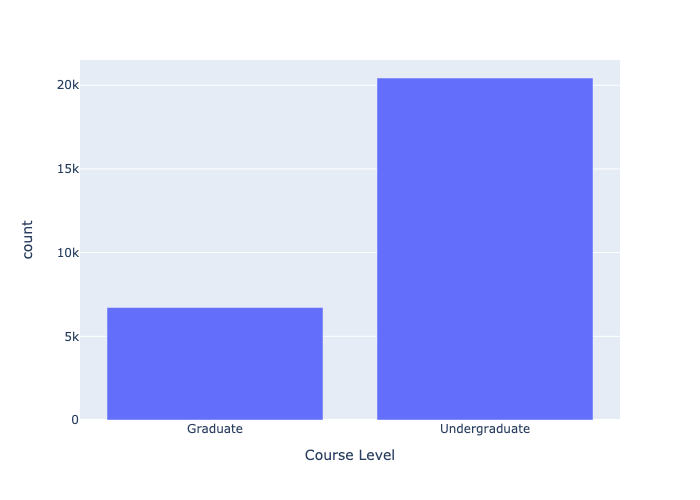

In [159]:
figure1 = px.bar(test_df2, x='Course Level', y='count')
I1 = figure1.to_image(format="png")
Image(I1)

In [160]:
#courses_df2 = pd.read_csv('../data/courses_temp1.csv',sep ='\xa0') 
#courses_df2

In [161]:
#courses_df1[['deptcode']]= courses_df1['CourseNumber'].str.split(' ',0)

In [162]:
repeated_courses = ['Experimental Course','Thesis','Thesis Extension','Dissertation Extension',
             'Independent Study','Dissertation','Independent Doctoral Research', 'Clinical Supervision',
             'Counseling Internship','Directed Doctoral Research','Advanced Counseling Internship',
             'Doctoral Dissertation Research','Research Extension','Directed Research','Internship','Directed Reading','Special Topics']

In [163]:
courses_df2 = courses_df

In [164]:
courses_df2 = courses_df2[~courses_df2['CourseTitle'].str.contains('|'.join(repeated_courses))]
courses_df2

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University,colisted_cno,deptcode,cno,Course Level
0,ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,0,ACCT,5220,Graduate
1,ACCT 5311,Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC,0,ACCT,5311,Graduate
2,ACCT 5312,Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC,0,ACCT,5312,Graduate
3,ACCT 6110,Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC,0,ACCT,6110,Graduate
4,ACCT 6120,Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC,0,ACCT,6120,Graduate
...,...,...,...,...,...,...,...,...,...
27149,WLC 8320,Cultural and Literary Analysis and Production,Cultural and Literary Analysis and Production3...,World Languages and Cultures,GSU,0,WLC,8320,Graduate
27150,WLC 8330,"The Media, the Arts, and Popular Culture","The Media, the Arts, and Popular Culture3 Cred...",World Languages and Cultures,GSU,0,WLC,8330,Graduate
27151,WLC 8340,Learning a World Language,Learning a World Language3 Credit Hours Descr...,World Languages and Cultures,GSU,0,WLC,8340,Graduate
27152,WLC 8350,"Identities, Borders, and Social Justice in Lan...","Identities, Borders, and Social Justice in Lan...",World Languages and Cultures,GSU,0,WLC,8350,Graduate


In [165]:
courses_df = courses_df.loc[courses_df.CourseTitle.apply(lambda x : type(x) != float and x.strip() not in repeated_courses)]
courses_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University,colisted_cno,deptcode,cno,Course Level
0,ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,0,ACCT,5220,Graduate
1,ACCT 5311,Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC,0,ACCT,5311,Graduate
2,ACCT 5312,Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC,0,ACCT,5312,Graduate
3,ACCT 6110,Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC,0,ACCT,6110,Graduate
4,ACCT 6120,Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC,0,ACCT,6120,Graduate
...,...,...,...,...,...,...,...,...,...
27149,WLC 8320,Cultural and Literary Analysis and Production,Cultural and Literary Analysis and Production3...,World Languages and Cultures,GSU,0,WLC,8320,Graduate
27150,WLC 8330,"The Media, the Arts, and Popular Culture","The Media, the Arts, and Popular Culture3 Cred...",World Languages and Cultures,GSU,0,WLC,8330,Graduate
27151,WLC 8340,Learning a World Language,Learning a World Language3 Credit Hours Descr...,World Languages and Cultures,GSU,0,WLC,8340,Graduate
27152,WLC 8350,"Identities, Borders, and Social Justice in Lan...","Identities, Borders, and Social Justice in Lan...",World Languages and Cultures,GSU,0,WLC,8350,Graduate


In [166]:
undergrad_df = courses_df[courses_df['Course Level']== 'Undergraduate']
undergrad_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University,colisted_cno,deptcode,cno,Course Level
3002,DSC 495,Special Topics in Data Science,Offered as needed to present material not norm...,Academy of Data Science,NCSU,0,DSC,495,Undergraduate
3003,ACC 200,Introduction to Managerial Accounting,Analysis of accounting data that are useful i...,Accounting,NCSU,0,ACC,200,Undergraduate
3004,ACC 210,Concepts of Financial Reporting,"Financial reporting concepts, the accounting i...",Accounting,NCSU,0,ACC,210,Undergraduate
3005,ACC 220,Introduction to Managerial Accounting,The course is designed to provide students wit...,Accounting,NCSU,0,ACC,220,Undergraduate
3006,ACC 230,Individual Income Taxation,The course focuses on the fundamental concepts...,Accounting,NCSU,0,ACC,230,Undergraduate
...,...,...,...,...,...,...,...,...,...
23889,CHEM 3950,Chemical Research,Chemical Research1 to 5 Credit Hours Prerequis...,Chemistry,GSU,0,CHEM,3950,Undergraduate
23890,CHEM 4690,Special Topics in Biochemistry,Special Topics in Biochemistry3 Credit Hours P...,Chemistry,GSU,0,CHEM,4690,Undergraduate
24346,CRJU 4995,Undergraduate Research Practicum,Undergraduate Research Practicum1 to 6 Credit ...,Criminal Justice,GSU,0,CRJU,4995,Undergraduate
24947,FLME 4765,Gender in Film and Television,Gender in Film and Television3 Credit Hours Pr...,Film and Media,GSU,0,FLME,4765,Undergraduate


In [167]:
graduate_df = courses_df[courses_df['Course Level']== 'Graduate']
graduate_df

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University,colisted_cno,deptcode,cno,Course Level
0,ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,0,ACCT,5220,Graduate
1,ACCT 5311,Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC,0,ACCT,5311,Graduate
2,ACCT 5312,Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC,0,ACCT,5312,Graduate
3,ACCT 6110,Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC,0,ACCT,6110,Graduate
4,ACCT 6120,Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC,0,ACCT,6120,Graduate
...,...,...,...,...,...,...,...,...,...
27149,WLC 8320,Cultural and Literary Analysis and Production,Cultural and Literary Analysis and Production3...,World Languages and Cultures,GSU,0,WLC,8320,Graduate
27150,WLC 8330,"The Media, the Arts, and Popular Culture","The Media, the Arts, and Popular Culture3 Cred...",World Languages and Cultures,GSU,0,WLC,8330,Graduate
27151,WLC 8340,Learning a World Language,Learning a World Language3 Credit Hours Descr...,World Languages and Cultures,GSU,0,WLC,8340,Graduate
27152,WLC 8350,"Identities, Borders, and Social Justice in Lan...","Identities, Borders, and Social Justice in Lan...",World Languages and Cultures,GSU,0,WLC,8350,Graduate


In [168]:
def desc_to_words(description):
    final =[]
    for sent in description:
        words = gensim.utils.simple_preprocess(str(sent), deacc=True) 
        final.append(words) 
    return final
data = (courses_df['CourseDescription']) 
data_words = (desc_to_words(data))
print(data_words)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [169]:
stop_words = stopwords.words('english')
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [170]:
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) 
trigram = gensim.models.Phrases(bigram[data_words], threshold=100) 

In [171]:
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [172]:
def remove_stopwords(texts):
    final1 = []
    for doc in texts:
        final = []
        for word in simple_preprocess(str(doc)):
            if word not in stop_words:
                final.append(word)
        final1.append(final)
    return(final1)


In [173]:
data_words_nostops = remove_stopwords(data_words)
print(data_words_nostops)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [174]:
def bigrams(texts):
    x = []
    for doc in texts:
        x.append(bigram_mod[doc])
    return x

In [175]:
data_words_bigrams = bigrams(data_words_nostops)
print(data_words_bigrams)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [176]:
def trigrams(texts):
    x = []
    for doc in texts:
        x.append(trigram_mod[bigram_mod[doc]])
    return x

In [177]:
data_words_trigrams = trigrams(data_words_bigrams)
print(data_words_trigrams)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [178]:
def lemmatization(texts,allowed_postags = ['NOUN','ADJ','VERB','ADV']):
    nlp = spacy.load('en_core_web_sm', disable =['parser','ner'])
    texts_final = []
    for sent in texts:
        texts_final1 = []
        doc = nlp(" ".join(sent))
        for token in doc:
            if token.pos_ in allowed_postags:
                texts_final1.append(token.lemma_)
        texts_final.append(texts_final1)
        
    return texts_final
    

In [179]:
data_lemmatized = lemmatization(data_words_trigrams, allowed_postags = ['NOUN','ADJ','VERB','ADV'])
print(data_lemmatized)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [180]:
#def lemmatization1(data_words, stop_words= stop_words, allowed_postags = ['NOUN','ADJ','VERB','ADV']):
   # nlp = spacy.load('en_core_web_sm', disable =['parser','ner'])
    #text_out = []
   # for words in data:
    #    doc = nlp((words))
       # new_word =[]
       # for token in doc:
            #if token.pos_ in allowed_postags:
                #new_word.append(token.lemma_)
        #final = ' '.join(new_word)
        #text_out.append(final)
    #return text_out

#lemmatization_words = lemmatization(data_words)
#print(lemmatization_words)
#len(lemmatization_words)

In [181]:
id2word = corpora.Dictionary(data_lemmatized) #gives key words of the data_lemmatized
#print(id2word)
corpus = []

for words in data_lemmatized:
    new = id2word.doc2bow(words)    #bag of words
    corpus.append(new)
print(corpus)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [182]:
len(corpus)

26857

In [183]:
# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=id2word, num_topics=20, random_state=100,
                chunksize=100, passes=10, update_every = 1)

In [184]:
lda_model.print_topics()

[(0,
  '0.269*"health" + 0.084*"science" + 0.069*"care" + 0.051*"various" + 0.035*"provide" + 0.031*"practical" + 0.031*"practicum" + 0.029*"law" + 0.028*"overview" + 0.028*"life"'),
 (1,
  '0.317*"hour" + 0.310*"credit" + 0.047*"include" + 0.029*"education" + 0.026*"clinical" + 0.026*"development" + 0.021*"requirement" + 0.020*"organization" + 0.018*"provide" + 0.014*"emphasis"'),
 (2,
  '0.158*"theory" + 0.084*"issue" + 0.057*"examine" + 0.046*"contemporary" + 0.046*"perspective" + 0.038*"practice" + 0.037*"review" + 0.036*"financial" + 0.035*"theoretical" + 0.032*"current"'),
 (3,
  '0.135*"advanced" + 0.124*"high" + 0.096*"grade" + 0.090*"level" + 0.089*"assessment" + 0.088*"language" + 0.060*"performance" + 0.054*"philosophy" + 0.038*"related" + 0.029*"discipline"'),
 (4,
  '0.173*"physical" + 0.133*"structure" + 0.074*"value" + 0.074*"form" + 0.049*"biological" + 0.042*"biology" + 0.036*"investigation" + 0.032*"include" + 0.029*"molecular" + 0.029*"common"'),
 (5,
  '0.084*"cours

In [185]:
print('Perplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model,corpus= corpus,texts=data_lemmatized, dictionary=id2word,coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Perplexity:  -15.761077197465053
Coherence Score:  0.39322704293608834


In [186]:
def coherences(dictionary, corpus, texts, limit, start, step):
    coherence_values = []
    model_list = []
    n_topics = []
    perplexity_values = []
    for num_topics1 in range(start, limit, step):
        lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=id2word, num_topics=num_topics1, random_state=100,
                chunksize=100, passes=10, update_every = 1)
        model_list.append(lda_model)
        perplexity_values.append(lda_model.log_perplexity(corpus))
        n_topics.append(num_topics1)
        coherencemodel = CoherenceModel(model=lda_model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values,n_topics, perplexity_values

In [187]:
model_list, coherence_values,n_topics, perplexity_values = coherences(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=5, limit=50, step=5)



In [188]:
df1= pd.DataFrame(coherence_values, columns=['Coherence'])
df2= pd.DataFrame(perplexity_values, columns=['Perplexity'])

In [189]:
normalized_df1=(df1-df1.min())/(df1.max()-df1.min())
normalized_df2=(df2-df2.min())/(df2.max()-df2.min())

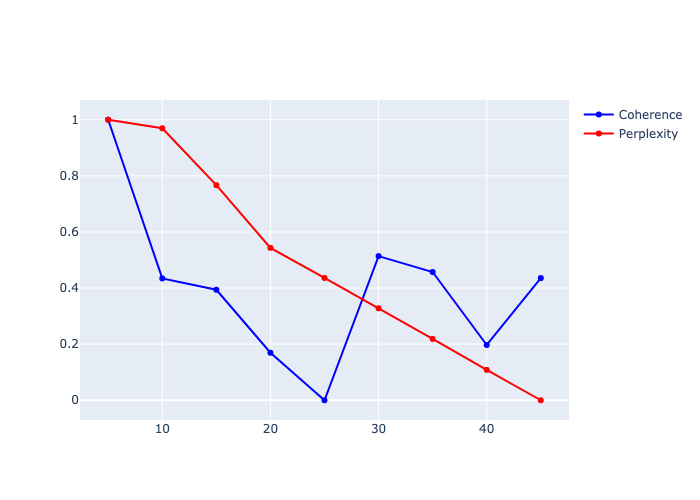

In [190]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=n_topics, y=normalized_df1['Coherence'], name='Coherence',
                         line=dict(color='blue')))

fig.add_trace(go.Scatter(x=n_topics, y=normalized_df2['Perplexity'], name='Perplexity',
                         line=dict(color='red')))

fig.show()


img = fig.to_image(format="png")
Image(img)

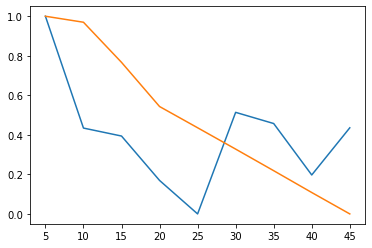

In [191]:
x = range(5, 50, 5)
plt.figure()
plt.plot(x, normalized_df1['Coherence'])
plt.plot(x,normalized_df2['Perplexity'])
plt.show()

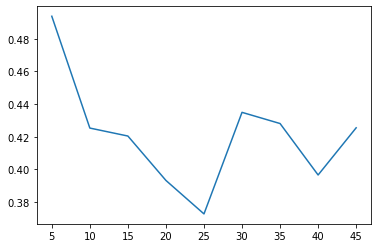

In [192]:
x = range(5, 50, 5)
plt.figure()
plt.plot(x,coherence_values)
plt.show()

In [193]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus, id2word=id2word, num_topics=29, random_state=100,
                chunksize=100, passes=10, update_every = 1)

In [194]:
print('Perplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
from gensim.models.coherencemodel import CoherenceModel
coherence_model_lda = CoherenceModel(model=lda_model,corpus= corpus,texts=data_lemmatized, dictionary=id2word,coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('Coherence Score: ', coherence_lda)

Perplexity:  -19.254870899350646
Coherence Score:  0.39060370397888555


In [195]:
LDAtopics = lda_model.show_topics(num_topics=29,formatted=False)

In [196]:
LDAtopics

[(0,
  [('health', 0.23150444),
   ('course', 0.09516794),
   ('care', 0.058915272),
   ('provide', 0.04609189),
   ('various', 0.04383555),
   ('address', 0.037142355),
   ('issue', 0.03374141),
   ('focus', 0.028318426),
   ('specific', 0.027392618),
   ('overview', 0.02577136)]),
 (1,
  [('management', 0.17364511),
   ('system', 0.12003866),
   ('organization', 0.075409934),
   ('process', 0.07471014),
   ('information', 0.054574233),
   ('plan', 0.0385772),
   ('decision', 0.030093305),
   ('planning', 0.029097531),
   ('operation', 0.02739572),
   ('control', 0.027251052)]),
 (2,
  [('introduction', 0.29984865),
   ('role', 0.23228298),
   ('procedure', 0.10443009),
   ('form', 0.09213651),
   ('emerge', 0.062945925),
   ('alternative', 0.053460266),
   ('objective', 0.04674715),
   ('potential', 0.020594925),
   ('pertain', 0.015247683),
   ('prerequisite', 4.365511e-06)]),
 (3,
  [('advanced', 0.18557702),
   ('high', 0.17082563),
   ('grade', 0.13233808),
   ('level', 0.1234110

In [197]:
pyLDAvis.enable_notebook()

In [198]:
pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word, mds='mmds')

/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/opt/anaconda3/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in fav

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
19     0.223770  0.436482       1        1  8.950826
5      0.406590  0.202213       2        1  7.428079
15     0.034371  0.280784       3        1  6.020723
8      0.032573  0.483755       4        1  5.782491
0      0.327456  0.077894       5        1  5.242575
18     0.451750 -0.156009       6        1  5.000598
23    -0.104775  0.389486       7        1  4.852848
10    -0.479768 -0.129926       8        1  4.582189
1     -0.476930  0.132935       9        1  4.509461
21     0.394464  0.337095      10        1  4.326929
22     0.228966  0.240717      11        1  3.460069
13    -0.221475  0.467151      12        1  3.386801
24    -0.153643  0.136235      13        1  3.361723
17    -0.315915  0.339728      14        1  3.052985
25    -0.052649 -0.515562      15        1  2.948254
27    -0.371746  0.217108      16        1  2.916830
11    -0.147961 -0.087995      17        1  2.863980
3     -0.419343 -0.001942      18        1  2.688940
20     0.269836 -0.165355      19        1  2.565470
16     0.506399  0.010569      20        1  2.440458
12    -0.337538 -0.202637      21        1  2.300199
28     0.151778 -0.484105      22        1  1.946547
14     0.099206  0.032133      23        1  1.939510
7     -0.214622 -0.421973      24        1  1.737941
4     -0.351000 -0.347556      25        1  1.726400
2      0.054715 -0.332457      26        1  1.620191
26     0.352387 -0.324373      27        1  0.848791
6     -0.097104 -0.281725      28        1  0.749142
9      0.210210 -0.332668      29        1  0.749047, topic_info=            Term          Freq         Total Category  logprob  loglift
351  description  18777.000000  18777.000000  Default   30.000  30.0000
400         hour  19710.000000  19710.000000  Default   29.000  29.0000
190       credit  19235.000000  19235.000000  Default   28.000  28.0000
31         topic  10550.000000  10550.000000  Default   27.000  27.0000
48      research   9315.000000   9315.000000  Default   26.000  26.0000
..           ...           ...           ...      ...      ...      ...
0     applicable      0.055699    191.205456  Topic29  -11.456  -3.2470
1        concept      0.055699   3101.878031  Topic29  -11.456  -6.0334
2       emphasis      0.055699   2896.728729  Topic29  -11.456  -5.9650
3         entity      0.055699    106.142480  Topic29  -11.456  -2.6585
4        federal      0.055699    344.277292  Topic29  -11.456  -3.8351

[1046 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
761      13  0.993815         able
10       22  0.995728   accounting
184      22  0.996971  acquisition
662      11  0.994130          act
144      20  0.998531     activity
...     ...       ...          ...
371      25  0.998931        woman
406       2  0.999532         work
95       12  0.999164        write
504      10  0.996904      writing
259      20  0.995732         year

[688 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[20, 6, 16, 9, 1, 19, 24, 11, 2, 22, 23, 14, 25, 18, 26, 28, 12, 4, 21, 17, 13, 29, 15, 8, 5, 3, 27, 7, 10])

In [71]:
def format_topics_sentences1(ldamodel, corpus, texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        print('i',i)
        print('Row list',row_list)
        row = row_list[0] if ldamodel.per_word_topics else row_list 
        print('Before sort',row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        print('Row after sorted',row)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            print('j',j)
        #     if j == 0:  # => dominant topic
            wp = ldamodel.show_topic(topic_num)
            print('wp',wp)
            topic_keywords = ", ".join([word for word, prop in wp])
            sent_topics_df = sent_topics_df.append(pd.Series([int(i), data_lemmatized[i], int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            # else:
            #     break
    sent_topics_df.columns = ['Document_no','Document_Text','Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    # contents = pd.Series(texts)
    # sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords1 = format_topics_sentences1(ldamodel=lda_model, corpus=corpus[:5], texts=data_lemmatized)

i 0
Row list [(1, 0.1034523), (2, 0.20345838), (8, 0.10344998), (11, 0.10344736), (17, 0.3034565), (20, 0.10342088)]
Before sort [(1, 0.1034523), (2, 0.20345838), (8, 0.10344998), (11, 0.10344736), (17, 0.3034565), (20, 0.10342088)]
Row after sorted [(17, 0.3034565), (2, 0.20345838), (1, 0.1034523), (8, 0.10344998), (11, 0.10344736), (20, 0.10342088)]
j 0
wp [('emphasis', 0.10127332), ('review', 0.07333621), ('examine', 0.071893044), ('service', 0.071241245), ('impact', 0.062365547), ('ethic', 0.05035244), ('place', 0.049802378), ('state', 0.04487822), ('integrate', 0.044021595), ('issue', 0.031430196)]
j 1
wp [('introduction', 0.29984868), ('role', 0.23228301), ('procedure', 0.1044301), ('form', 0.09213652), ('emerge', 0.06294593), ('alternative', 0.053460274), ('objective', 0.046747155), ('potential', 0.020594927), ('pertain', 0.015247685), ('prerequisite', 4.3655114e-06)]
j 2
wp [('management', 0.1736451), ('system', 0.12003864), ('organization', 0.07540993), ('process', 0.07471013)

i 4
Row list [(0, 0.098586045), (17, 0.5556791), (24, 0.073661074), (26, 0.22417262)]
Before sort [(0, 0.098586045), (17, 0.5556791), (24, 0.073661074), (26, 0.22417262)]
Row after sorted [(17, 0.5556791), (26, 0.22417262), (0, 0.098586045), (24, 0.073661074)]
j 0
wp [('emphasis', 0.10127332), ('review', 0.07333621), ('examine', 0.071893044), ('service', 0.071241245), ('impact', 0.062365547), ('ethic', 0.05035244), ('place', 0.049802378), ('state', 0.04487822), ('integrate', 0.044021595), ('issue', 0.031430196)]
j 1
wp [('strategy', 0.49013388), ('identify', 0.12361276), ('limited', 0.056031328), ('creation', 0.04364394), ('drive', 0.041948244), ('rule', 0.030653268), ('phase', 0.02980493), ('limitation', 0.021892425), ('compliance', 0.013475792), ('handle', 0.013309302)]
j 2
wp [('health', 0.23150441), ('course', 0.09516793), ('care', 0.058915265), ('provide', 0.046091888), ('various', 0.043835547), ('address', 0.03714235), ('issue', 0.033741407), ('focus', 0.028318422), ('specific', 

In [72]:
def courses_topic_similarity(ldamodel, corpus, texts):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        
        
        row = row_list[0] if ldamodel.per_word_topics else row_list 
        
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            
        #     if j == 0:  # => dominant topic
            wp = ldamodel.show_topic(topic_num)
            
            topic_keywords = ", ".join([word for word, prop in wp])
            sent_topics_df = sent_topics_df.append(pd.Series([int(i), data_lemmatized[i], int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            # else:
            #     break
    sent_topics_df.columns = ['Document_no','Document_Text','Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    # contents = pd.Series(texts)
    # sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = courses_topic_similarity(ldamodel=lda_model, corpus=corpus, texts=data_lemmatized)

In [73]:
df_topic_sents_keywords

,Document_no,Document_Text,Topic,Perc_Contribution,Topic_Keywords
0,0,"[introduction, federal, income_tax, system, em...",17,0.3035,"emphasis, review, examine, service, impact, et..."
1,0,"[introduction, federal, income_tax, system, em...",2,0.2035,"introduction, role, procedure, form, emerge, a..."
2,0,"[introduction, federal, income_tax, system, em...",1,0.1035,"management, system, organization, process, inf..."
3,0,"[introduction, federal, income_tax, system, em...",8,0.1034,"theory, application, introduce, practice, conc..."
4,0,"[introduction, federal, income_tax, system, em...",11,0.1034,"relate, gender, historical, conduct, environme..."
...,...,...,...,...,...
239784,26856,"[profession, career, intercultural, experience...",24,0.1058,"development, field, business, technology, cove..."
239785,26856,"[profession, career, intercultural, experience...",18,0.0493,"policy, social, language, economic, cultural, ..."
239786,26856,"[profession, career, intercultural, experience...",12,0.0493,"problem, communication, analytic, value, basis..."
239787,26856,"[profession, career, intercultural, experience...",11,0.0493,"relate, gender, historical, conduct, environme..."


In [74]:
df_topic_sents_keywords.dtypes

Document_no            int64
Document_Text         object
Topic                  int64
Perc_Contribution    float32
Topic_Keywords        object
dtype: object

In [75]:
df_topic_sents_keywords['Document_no'] = df_topic_sents_keywords['Document_no'].apply(lambda x : str(int(x)))

In [76]:
df_topic_sents_keywords.dtypes

Document_no           object
Document_Text         object
Topic                  int64
Perc_Contribution    float32
Topic_Keywords        object
dtype: object

In [77]:
courses_df_final = courses_df
courses_df_final.reset_index(inplace = True)

In [78]:
courses_df_final['Document_no'] = courses_df_final.index
courses_df_final['Document_no'] = courses_df_final['Document_no'].apply(lambda x : str(int(x)))

In [79]:
courses_df_final.dtypes

index                 int64
CourseNumber         object
CourseTitle          object
CourseDescription    object
CourseDepartment     object
University           object
colisted_cno         object
deptcode             object
cno                  object
Course Level         object
Document_no          object
dtype: object

In [80]:
courses_df_final

,index,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University,colisted_cno,deptcode,cno,Course Level,Document_no
0,0,ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,0,ACCT,5220,Graduate,0
1,1,ACCT 5311,Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC,0,ACCT,5311,Graduate,1
2,2,ACCT 5312,Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC,0,ACCT,5312,Graduate,2
3,3,ACCT 6110,Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC,0,ACCT,6110,Graduate,3
4,4,ACCT 6120,Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC,0,ACCT,6120,Graduate,4
...,...,...,...,...,...,...,...,...,...,...,...
26852,27149,WLC 8320,Cultural and Literary Analysis and Production,Cultural and Literary Analysis and Production3...,World Languages and Cultures,GSU,0,WLC,8320,Graduate,26852
26853,27150,WLC 8330,"The Media, the Arts, and Popular Culture","The Media, the Arts, and Popular Culture3 Cred...",World Languages and Cultures,GSU,0,WLC,8330,Graduate,26853
26854,27151,WLC 8340,Learning a World Language,Learning a World Language3 Credit Hours Descr...,World Languages and Cultures,GSU,0,WLC,8340,Graduate,26854
26855,27152,WLC 8350,"Identities, Borders, and Social Justice in Lan...","Identities, Borders, and Social Justice in Lan...",World Languages and Cultures,GSU,0,WLC,8350,Graduate,26855


In [81]:
del courses_df_final['index']

In [82]:
courses_df_final

,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University,colisted_cno,deptcode,cno,Course Level,Document_no
0,ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,0,ACCT,5220,Graduate,0
1,ACCT 5311,Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC,0,ACCT,5311,Graduate,1
2,ACCT 5312,Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC,0,ACCT,5312,Graduate,2
3,ACCT 6110,Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC,0,ACCT,6110,Graduate,3
4,ACCT 6120,Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC,0,ACCT,6120,Graduate,4
...,...,...,...,...,...,...,...,...,...,...
26852,WLC 8320,Cultural and Literary Analysis and Production,Cultural and Literary Analysis and Production3...,World Languages and Cultures,GSU,0,WLC,8320,Graduate,26852
26853,WLC 8330,"The Media, the Arts, and Popular Culture","The Media, the Arts, and Popular Culture3 Cred...",World Languages and Cultures,GSU,0,WLC,8330,Graduate,26853
26854,WLC 8340,Learning a World Language,Learning a World Language3 Credit Hours Descr...,World Languages and Cultures,GSU,0,WLC,8340,Graduate,26854
26855,WLC 8350,"Identities, Borders, and Social Justice in Lan...","Identities, Borders, and Social Justice in Lan...",World Languages and Cultures,GSU,0,WLC,8350,Graduate,26855


In [83]:
merged_df = pd.merge(df_topic_sents_keywords, courses_df_final, on = 'Document_no', how = 'left')

In [84]:
merged_df

,Document_no,Document_Text,Topic,Perc_Contribution,Topic_Keywords,CourseNumber,CourseTitle,CourseDescription,CourseDepartment,University,colisted_cno,deptcode,cno,Course Level
0,0,"[introduction, federal, income_tax, system, em...",17,0.3035,"emphasis, review, examine, service, impact, et...",ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,0,ACCT,5220,Graduate
1,0,"[introduction, federal, income_tax, system, em...",2,0.2035,"introduction, role, procedure, form, emerge, a...",ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,0,ACCT,5220,Graduate
2,0,"[introduction, federal, income_tax, system, em...",1,0.1035,"management, system, organization, process, inf...",ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,0,ACCT,5220,Graduate
3,0,"[introduction, federal, income_tax, system, em...",8,0.1034,"theory, application, introduce, practice, conc...",ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,0,ACCT,5220,Graduate
4,0,"[introduction, federal, income_tax, system, em...",11,0.1034,"relate, gender, historical, conduct, environme...",ACCT 5220,Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,0,ACCT,5220,Graduate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
239784,26856,"[profession, career, intercultural, experience...",24,0.1058,"development, field, business, technology, cove...",WLC 8360,"The Profession, Career and Intercultural Exper...","The Profession, Career and Intercultural Exper...",World Languages and Cultures,GSU,0,WLC,8360,Graduate
239785,26856,"[profession, career, intercultural, experience...",18,0.0493,"policy, social, language, economic, cultural, ...",WLC 8360,"The Profession, Career and Intercultural Exper...","The Profession, Career and Intercultural Exper...",World Languages and Cultures,GSU,0,WLC,8360,Graduate
239786,26856,"[profession, career, intercultural, experience...",12,0.0493,"problem, communication, analytic, value, basis...",WLC 8360,"The Profession, Career and Intercultural Exper...","The Profession, Career and Intercultural Exper...",World Languages and Cultures,GSU,0,WLC,8360,Graduate
239787,26856,"[profession, career, intercultural, experience...",11,0.0493,"relate, gender, historical, conduct, environme...",WLC 8360,"The Profession, Career and Intercultural Exper...","The Profession, Career and Intercultural Exper...",World Languages and Cultures,GSU,0,WLC,8360,Graduate


In [85]:
merged_df.dtypes

Document_no           object
Document_Text         object
Topic                  int64
Perc_Contribution    float32
Topic_Keywords        object
CourseNumber          object
CourseTitle           object
CourseDescription     object
CourseDepartment      object
University            object
colisted_cno          object
deptcode              object
cno                   object
Course Level          object
dtype: object

In [86]:
grouped_df = merged_df.groupby(['Document_no','Topic','Perc_Contribution', 'CourseNumber'])
grouped_df

In [87]:
grouped_df.groups

{('0', 1, 0.10350000113248825, 'ACCT 5220'): [2], ('0', 2, 0.20350000262260437, 'ACCT 5220'): [1], ('0', 8, 0.10339999943971634, 'ACCT 5220'): [3], ('0', 11, 0.10339999943971634, 'ACCT 5220'): [4], ('0', 17, 0.3034999966621399, 'ACCT 5220'): [0], ('0', 20, 0.10339999943971634, 'ACCT 5220'): [5], ('1', 0, 0.10339999943971634, 'ACCT 5311'): [10], ('1', 6, 0.10339999943971634, 'ACCT 5311'): [11], ('1', 13, 0.10339999943971634, 'ACCT 5311'): [9], ('1', 17, 0.10350000113248825, 'ACCT 5311'): [8], ('1', 25, 0.10350000113248825, 'ACCT 5311'): [7], ('1', 28, 0.4034999907016754, 'ACCT 5311'): [6], ('10', 0, 0.08900000154972076, 'ACCT 6210'): [72], ('10', 1, 0.3528999984264374, 'ACCT 6210'): [68], ('10', 2, 0.12639999389648438, 'ACCT 6210'): [69], ('10', 6, 0.04309999942779541, 'ACCT 6210'): [74], ('10', 7, 0.04490000009536743, 'ACCT 6210'): [73], ('10', 10, 0.09480000287294388, 'ACCT 6210'): [70], ('10', 12, 0.04309999942779541, 'ACCT 6210'): [77], ('10', 24, 0.04309999942779541, 'ACCT 6210'): 

In [88]:
grouped_df.groups.keys()

dict_keys([('0', 1, 0.10350000113248825, 'ACCT 5220'), ('0', 2, 0.20350000262260437, 'ACCT 5220'), ('0', 8, 0.10339999943971634, 'ACCT 5220'), ('0', 11, 0.10339999943971634, 'ACCT 5220'), ('0', 17, 0.3034999966621399, 'ACCT 5220'), ('0', 20, 0.10339999943971634, 'ACCT 5220'), ('1', 0, 0.10339999943971634, 'ACCT 5311'), ('1', 6, 0.10339999943971634, 'ACCT 5311'), ('1', 13, 0.10339999943971634, 'ACCT 5311'), ('1', 17, 0.10350000113248825, 'ACCT 5311'), ('1', 25, 0.10350000113248825, 'ACCT 5311'), ('1', 28, 0.4034999907016754, 'ACCT 5311'), ('10', 0, 0.08900000154972076, 'ACCT 6210'), ('10', 1, 0.3528999984264374, 'ACCT 6210'), ('10', 2, 0.12639999389648438, 'ACCT 6210'), ('10', 6, 0.04309999942779541, 'ACCT 6210'), ('10', 7, 0.04490000009536743, 'ACCT 6210'), ('10', 10, 0.09480000287294388, 'ACCT 6210'), ('10', 12, 0.04309999942779541, 'ACCT 6210'), ('10', 24, 0.04309999942779541, 'ACCT 6210'), ('10', 27, 0.04309999942779541, 'ACCT 6210'), ('10', 28, 0.09229999780654907, 'ACCT 6210'), ('

In [89]:
final_group = list(grouped_df.groups.keys())

In [90]:
final_group

[('0', 1, 0.10350000113248825, 'ACCT 5220'),
 ('0', 2, 0.20350000262260437, 'ACCT 5220'),
 ('0', 8, 0.10339999943971634, 'ACCT 5220'),
 ('0', 11, 0.10339999943971634, 'ACCT 5220'),
 ('0', 17, 0.3034999966621399, 'ACCT 5220'),
 ('0', 20, 0.10339999943971634, 'ACCT 5220'),
 ('1', 0, 0.10339999943971634, 'ACCT 5311'),
 ('1', 6, 0.10339999943971634, 'ACCT 5311'),
 ('1', 13, 0.10339999943971634, 'ACCT 5311'),
 ('1', 17, 0.10350000113248825, 'ACCT 5311'),
 ('1', 25, 0.10350000113248825, 'ACCT 5311'),
 ('1', 28, 0.4034999907016754, 'ACCT 5311'),
 ('10', 0, 0.08900000154972076, 'ACCT 6210'),
 ('10', 1, 0.3528999984264374, 'ACCT 6210'),
 ('10', 2, 0.12639999389648438, 'ACCT 6210'),
 ('10', 6, 0.04309999942779541, 'ACCT 6210'),
 ('10', 7, 0.04490000009536743, 'ACCT 6210'),
 ('10', 10, 0.09480000287294388, 'ACCT 6210'),
 ('10', 12, 0.04309999942779541, 'ACCT 6210'),
 ('10', 24, 0.04309999942779541, 'ACCT 6210'),
 ('10', 27, 0.04309999942779541, 'ACCT 6210'),
 ('10', 28, 0.09229999780654907, 'ACCT

In [91]:
edge_attributes = []
for i in range(len(final_group)):
    edge_attributes.append((final_group[i][3] ,'Topic ' + str(final_group[i][1]), {'Weight': final_group[i][2]}))
    

In [92]:
edge_attributes

[('ACCT 5220', 'Topic 1', {'Weight': 0.10350000113248825}),
 ('ACCT 5220', 'Topic 2', {'Weight': 0.20350000262260437}),
 ('ACCT 5220', 'Topic 8', {'Weight': 0.10339999943971634}),
 ('ACCT 5220', 'Topic 11', {'Weight': 0.10339999943971634}),
 ('ACCT 5220', 'Topic 17', {'Weight': 0.3034999966621399}),
 ('ACCT 5220', 'Topic 20', {'Weight': 0.10339999943971634}),
 ('ACCT 5311', 'Topic 0', {'Weight': 0.10339999943971634}),
 ('ACCT 5311', 'Topic 6', {'Weight': 0.10339999943971634}),
 ('ACCT 5311', 'Topic 13', {'Weight': 0.10339999943971634}),
 ('ACCT 5311', 'Topic 17', {'Weight': 0.10350000113248825}),
 ('ACCT 5311', 'Topic 25', {'Weight': 0.10350000113248825}),
 ('ACCT 5311', 'Topic 28', {'Weight': 0.4034999907016754}),
 ('ACCT 6210', 'Topic 0', {'Weight': 0.08900000154972076}),
 ('ACCT 6210', 'Topic 1', {'Weight': 0.3528999984264374}),
 ('ACCT 6210', 'Topic 2', {'Weight': 0.12639999389648438}),
 ('ACCT 6210', 'Topic 6', {'Weight': 0.04309999942779541}),
 ('ACCT 6210', 'Topic 7', {'Weight':

In [93]:
merged_df.dtypes

Document_no           object
Document_Text         object
Topic                  int64
Perc_Contribution    float32
Topic_Keywords        object
CourseNumber          object
CourseTitle           object
CourseDescription     object
CourseDepartment      object
University            object
colisted_cno          object
deptcode              object
cno                   object
Course Level          object
dtype: object

In [94]:
merged_df['Document_Text'] = [', '.join(i for i in j) for j in merged_df.Document_Text]
merged_df['Topic']= merged_df.Topic.apply(lambda x : 'Topic ' + str(int(x)))

In [95]:
merged_df_final = merged_df[['Document_no','Document_Text','CourseTitle','CourseDescription','CourseDepartment','University','CourseNumber']]


In [96]:
merged_df_final

,Document_no,Document_Text,CourseTitle,CourseDescription,CourseDepartment,University,CourseNumber
0,0,"introduction, federal, income_tax, system, emp...",Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,ACCT 5220
1,0,"introduction, federal, income_tax, system, emp...",Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,ACCT 5220
2,0,"introduction, federal, income_tax, system, emp...",Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,ACCT 5220
3,0,"introduction, federal, income_tax, system, emp...",Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,ACCT 5220
4,0,"introduction, federal, income_tax, system, emp...",Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,ACCT 5220
...,...,...,...,...,...,...,...
239784,26856,"profession, career, intercultural, experience,...","The Profession, Career and Intercultural Exper...","The Profession, Career and Intercultural Exper...",World Languages and Cultures,GSU,WLC 8360
239785,26856,"profession, career, intercultural, experience,...","The Profession, Career and Intercultural Exper...","The Profession, Career and Intercultural Exper...",World Languages and Cultures,GSU,WLC 8360
239786,26856,"profession, career, intercultural, experience,...","The Profession, Career and Intercultural Exper...","The Profession, Career and Intercultural Exper...",World Languages and Cultures,GSU,WLC 8360
239787,26856,"profession, career, intercultural, experience,...","The Profession, Career and Intercultural Exper...","The Profession, Career and Intercultural Exper...",World Languages and Cultures,GSU,WLC 8360


In [97]:
merged_df_final.drop_duplicates(['Document_no','CourseTitle','CourseDepartment','CourseDescription','University'], inplace = True)

In [98]:
merged_df_final

,Document_no,Document_Text,CourseTitle,CourseDescription,CourseDepartment,University,CourseNumber
0,0,"introduction, federal, income_tax, system, emp...",Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,ACCT 5220
6,1,"analysis, financial, reporting, requirement, c...",Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC,ACCT 5311
12,2,"continuation, acct, emphasis, financial, repor...",Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC,ACCT 5312
19,3,"tax, research, technique, applicable, federal,...",Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC,ACCT 6110
29,4,"examine, federal, state, tax, law, applicable,...",Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC,ACCT 6120
...,...,...,...,...,...,...,...
239744,26852,"literary, analysis, production, credit, hour, ...",Cultural and Literary Analysis and Production,Cultural and Literary Analysis and Production3...,World Languages and Cultures,GSU,WLC 8320
239752,26853,"medium, art, popular, culture, credit, hour, d...","The Media, the Arts, and Popular Culture","The Media, the Arts, and Popular Culture3 Cred...",World Languages and Cultures,GSU,WLC 8330
239762,26854,"learn, world, language, credit, hour, descript...",Learning a World Language,Learning a World Language3 Credit Hours Descr...,World Languages and Cultures,GSU,WLC 8340
239772,26855,"identitie, border, social, language, teaching,...","Identities, Borders, and Social Justice in Lan...","Identities, Borders, and Social Justice in Lan...",World Languages and Cultures,GSU,WLC 8350


In [100]:
topic_df = merged_df.groupby(['Topic','Topic_Keywords']).size().reset_index()
topic_df

,Topic,Topic_Keywords,0
0,Topic 0,"health, course, care, provide, various, addres...",9617
1,Topic 1,"management, system, organization, process, inf...",9591
2,Topic 10,"analysis, datum, science, method, technique, a...",9321
3,Topic 11,"relate, gender, historical, conduct, environme...",8859
4,Topic 12,"problem, communication, analytic, value, basis...",6940
5,Topic 13,"major, theoretical, contemporary, perspective,...",10347
6,Topic 14,"community, also, different, way, component, th...",6310
7,Topic 15,"description, instructor, design, project, skil...",13572
8,Topic 16,"research, graduate, student, opportunity, acti...",6930
9,Topic 17,"emphasis, review, examine, service, impact, et...",8650


In [123]:
topic_df1 = merged_df.groupby(['Topic','Topic_Keywords']).size().reset_index()
topic_df1

,Topic,Topic_Keywords,0
0,Topic 0,"health, course, care, provide, various, addres...",9617
1,Topic 1,"management, system, organization, process, inf...",9591
2,Topic 10,"analysis, datum, science, method, technique, a...",9321
3,Topic 11,"relate, gender, historical, conduct, environme...",8859
4,Topic 12,"problem, communication, analytic, value, basis...",6940
5,Topic 13,"major, theoretical, contemporary, perspective,...",10347
6,Topic 14,"community, also, different, way, component, th...",6310
7,Topic 15,"description, instructor, design, project, skil...",13572
8,Topic 16,"research, graduate, student, opportunity, acti...",6930
9,Topic 17,"emphasis, review, examine, service, impact, et...",8650


In [124]:
topic_df2 = topic_df1[['Topic', 'Topic_Keywords']]
topic_df2

,Topic,Topic_Keywords
0,Topic 0,"health, course, care, provide, various, addres..."
1,Topic 1,"management, system, organization, process, inf..."
2,Topic 10,"analysis, datum, science, method, technique, a..."
3,Topic 11,"relate, gender, historical, conduct, environme..."
4,Topic 12,"problem, communication, analytic, value, basis..."
5,Topic 13,"major, theoretical, contemporary, perspective,..."
6,Topic 14,"community, also, different, way, component, th..."
7,Topic 15,"description, instructor, design, project, skil..."
8,Topic 16,"research, graduate, student, opportunity, acti..."
9,Topic 17,"emphasis, review, examine, service, impact, et..."


In [125]:
topic_df2.to_csv('../data/topics.csv')

In [101]:
topic_df['Document_no'] = topic_df.Topic
topic_df['CourseNumber'] = topic_df.Topic
topic_df.pop(0);
topic_df.pop('Topic_Keywords');
topic_df.pop('Topic');

In [102]:
topic_df

,Document_no,CourseNumber
0,Topic 0,Topic 0
1,Topic 1,Topic 1
2,Topic 10,Topic 10
3,Topic 11,Topic 11
4,Topic 12,Topic 12
5,Topic 13,Topic 13
6,Topic 14,Topic 14
7,Topic 15,Topic 15
8,Topic 16,Topic 16
9,Topic 17,Topic 17


In [103]:
check_df = pd.concat([merged_df_final,topic_df])

In [104]:
check_df

,Document_no,Document_Text,CourseTitle,CourseDescription,CourseDepartment,University,CourseNumber
0,0,"introduction, federal, income_tax, system, emp...",Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,ACCT 5220
6,1,"analysis, financial, reporting, requirement, c...",Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC,ACCT 5311
12,2,"continuation, acct, emphasis, financial, repor...",Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC,ACCT 5312
19,3,"tax, research, technique, applicable, federal,...",Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC,ACCT 6110
29,4,"examine, federal, state, tax, law, applicable,...",Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC,ACCT 6120
...,...,...,...,...,...,...,...
24,Topic 5,NaN,NaN,NaN,NaN,NaN,Topic 5
25,Topic 6,NaN,NaN,NaN,NaN,NaN,Topic 6
26,Topic 7,NaN,NaN,NaN,NaN,NaN,Topic 7
27,Topic 8,NaN,NaN,NaN,NaN,NaN,Topic 8


In [105]:
check_df.fillna('empty',inplace = True)

In [106]:
check_df

,Document_no,Document_Text,CourseTitle,CourseDescription,CourseDepartment,University,CourseNumber
0,0,"introduction, federal, income_tax, system, emp...",Income Tax,An introduction to the Federal income tax syst...,Accounting,UNCC,ACCT 5220
6,1,"analysis, financial, reporting, requirement, c...",Intermediate Financial Reporting I,Analysis of the financial reporting requiremen...,Accounting,UNCC,ACCT 5311
12,2,"continuation, acct, emphasis, financial, repor...",Intermediate Financial Reporting II,A continuation of ACCT 5311 with emphasis on ...,Accounting,UNCC,ACCT 5312
19,3,"tax, research, technique, applicable, federal,...",Tax Research and Planning,Tax research techniques applicable to federal ...,Accounting,UNCC,ACCT 6110
29,4,"examine, federal, state, tax, law, applicable,...",Taxation of Corporations and Shareholders,Examines the federal and state tax law applica...,Accounting,UNCC,ACCT 6120
...,...,...,...,...,...,...,...
24,Topic 5,empty,empty,empty,empty,empty,Topic 5
25,Topic 6,empty,empty,empty,empty,empty,Topic 6
26,Topic 7,empty,empty,empty,empty,empty,Topic 7
27,Topic 8,empty,empty,empty,empty,empty,Topic 8


In [107]:
course_details ={}

for i in check_df.CourseNumber:
    course_details[i] = {}
    
for i in check_df.CourseNumber:
   
    current = check_df.loc[check_df.CourseNumber == i]
    course_details[i]['Document_Text'] = current.Document_Text.values[0]
    course_details[i]['CourseTitle'] = current.CourseTitle.values[0]
    course_details[i]['CourseDescription'] = current.CourseDescription.values[0]
    course_details[i]['CourseDepartment'] = current.CourseDepartment.values[0]
    course_details[i]['University'] = current.University.values[0]


In [108]:
course_details

{'ACCT 5220': {'Document_Text': 'introduction, federal, income_tax, system, emphasis, concept, procedure, applicable, type, entity',
  'CourseTitle': 'Income Tax',
  'CourseDescription': 'An introduction to the Federal income tax system with emphasis on concepts and procedures applicable to all types of entities.',
  'CourseDepartment': 'Accounting',
  'University': 'UNCC'},
 'ACCT 5311': {'Document_Text': 'analysis, financial, reporting, requirement, corporation, emphasis, conceptual, framework, accounting, asset',
  'CourseTitle': 'Intermediate Financial Reporting I',
  'CourseDescription': 'Analysis of the financial reporting requirements of corporations with emphasis on the conceptual framework and accounting for assets.',
  'CourseDepartment': 'Accounting',
  'University': 'UNCC'},
 'ACCT 5312': {'Document_Text': 'continuation, acct, emphasis, financial, reporting, liability, stockholder, equity, also, number, special, topic, include, accounting, investment, statement, cash_flow',

In [109]:
node_attributes = list(merged_df.CourseNumber.unique())

In [110]:
G = nx.Graph()
G.add_nodes_from(node_attributes)
nx.set_node_attributes(G,course_details) 
G.add_edges_from(edge_attributes)

In [111]:
nx.write_graphml(G, '../data/Graph/combined_courses.graphml')

In [112]:
len(G)

26846

In [113]:
len(node_attributes)

26817

In [114]:
G

In [115]:
LDAtopics[0]

(0,
 [('health', 0.23150444),
  ('course', 0.09516794),
  ('care', 0.058915272),
  ('provide', 0.04609189),
  ('various', 0.04383555),
  ('address', 0.037142355),
  ('issue', 0.03374141),
  ('focus', 0.028318426),
  ('specific', 0.027392618),
  ('overview', 0.02577136)])